In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.spatial.distance import cosine

%matplotlib inline

/Users/andymai/anaconda/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


In [2]:
df_data = pd.read_csv('data.csv')

In [3]:
df_data.head()

,SOC Code,Detailed SOC Occupation,Sample Name,Accounting and Business or Management\CIP CODE 52.0305,Accounting and Computer Science\CIP CODE 30.1601,Accounting and Finance\CIP CODE 52.0304,"Accounting and Related Services, Other\CIP CODE 52.0399",Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,Accounting\CIP CODE 52.0301,Acoustics\CIP CODE 40.0809,...,Word Processing\CIP CODE 11.0602,Work and Family Studies\CIP CODE 19.0000,Workforce Development and Training\CIP CODE 32.0111,"Writing, General\CIP CODE 23.1301",Yoga Teacher Training or Yoga Therapy\CIP CODE 51.3602,Youth Ministry\CIP CODE 39.0702,Youth Services or Administration\CIP CODE 44.0702,Zoological Medicine Residency Program\CIP CODE 60.0317,"Zoology or Animal Biology, Other\CIP CODE 26.0799",Zoology or Animal Biology\CIP CODE 26.0701
0,11-1011.00,Chief Executives,All,747.0,41.0,1550.0,5.0,4.0,6741.0,NaN,...,1.0,5.0,8.0,14.0,NaN,10.0,NaN,NaN,NaN,42.0
1,11-1011.00,Chief Executives,Males,411.0,23.0,1063.0,4.0,NaN,4119.0,NaN,...,1.0,2.0,4.0,1.0,NaN,8.0,NaN,NaN,NaN,21.0
2,11-1011.00,Chief Executives,Females,274.0,16.0,343.0,1.0,4.0,2034.0,NaN,...,NaN,3.0,4.0,13.0,NaN,NaN,NaN,NaN,NaN,19.0
3,11-1011.00,Chief Executives,Highest Degree Associates,22.0,4.0,19.0,NaN,1.0,177.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,11-1011.00,Chief Executives,Highest Degree Bachelors,486.0,24.0,807.0,3.0,3.0,4777.0,NaN,...,NaN,4.0,2.0,7.0,NaN,7.0,NaN,NaN,NaN,21.0


In [5]:
import json
majors = df_data.columns.tolist()
with open('majors.json', 'w') as fp:
    json.dump(majors, fp)

In [5]:
for column in df_data:
    if column not in ['SOC Code', 'Detailed SOC Occupation', 'Sample Name']:
        df_data[column] = df_data[column].fillna(0)
        df_data[column] = df_data[column].astype(int)

df_data[:5]

,SOC Code,Detailed SOC Occupation,Sample Name,Accounting and Business or Management\CIP CODE 52.0305,Accounting and Computer Science\CIP CODE 30.1601,Accounting and Finance\CIP CODE 52.0304,"Accounting and Related Services, Other\CIP CODE 52.0399",Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,Accounting\CIP CODE 52.0301,Acoustics\CIP CODE 40.0809,...,Word Processing\CIP CODE 11.0602,Work and Family Studies\CIP CODE 19.0000,Workforce Development and Training\CIP CODE 32.0111,"Writing, General\CIP CODE 23.1301",Yoga Teacher Training or Yoga Therapy\CIP CODE 51.3602,Youth Ministry\CIP CODE 39.0702,Youth Services or Administration\CIP CODE 44.0702,Zoological Medicine Residency Program\CIP CODE 60.0317,"Zoology or Animal Biology, Other\CIP CODE 26.0799",Zoology or Animal Biology\CIP CODE 26.0701
0,11-1011.00,Chief Executives,All,747,41,1550,5,4,6741,0,...,1,5,8,14,0,10,0,0,0,42
1,11-1011.00,Chief Executives,Males,411,23,1063,4,0,4119,0,...,1,2,4,1,0,8,0,0,0,21
2,11-1011.00,Chief Executives,Females,274,16,343,1,4,2034,0,...,0,3,4,13,0,0,0,0,0,19
3,11-1011.00,Chief Executives,Highest Degree Associates,22,4,19,0,1,177,0,...,0,0,0,0,0,0,0,0,0,0
4,11-1011.00,Chief Executives,Highest Degree Bachelors,486,24,807,3,3,4777,0,...,0,4,2,7,0,7,0,0,0,21


In [6]:
df_occ = df_data.drop(['SOC Code', 'Sample Name'], axis=1)

In [7]:
# group by detailed occupation
df_occ = df_occ.groupby(df_occ['Detailed SOC Occupation']).apply(np.sum)
df_occ

,Detailed SOC Occupation,Accounting and Business or Management\CIP CODE 52.0305,Accounting and Computer Science\CIP CODE 30.1601,Accounting and Finance\CIP CODE 52.0304,"Accounting and Related Services, Other\CIP CODE 52.0399",Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,Accounting\CIP CODE 52.0301,Acoustics\CIP CODE 40.0809,Acting\CIP CODE 50.0506,Actuarial Science\CIP CODE 52.1304,...,Word Processing\CIP CODE 11.0602,Work and Family Studies\CIP CODE 19.0000,Workforce Development and Training\CIP CODE 32.0111,"Writing, General\CIP CODE 23.1301",Yoga Teacher Training or Yoga Therapy\CIP CODE 51.3602,Youth Ministry\CIP CODE 39.0702,Youth Services or Administration\CIP CODE 44.0702,Zoological Medicine Residency Program\CIP CODE 60.0317,"Zoology or Animal Biology, Other\CIP CODE 26.0799",Zoology or Animal Biology\CIP CODE 26.0701
Detailed SOC Occupation,,,,,,,,,,,,,,,,,,,,,
Accountants and Auditors,Accountants and AuditorsAccountants and Audito...,17717,1665,28068,227,98,254479,0,7,122,...,6,4,4,4,0,4,0,0,0,18
Actors,ActorsActorsActorsActorsActorsActorsActorsActo...,0,0,0,0,0,8,0,32,0,...,0,0,0,0,0,0,0,0,0,0
Actuaries,ActuariesActuariesActuariesActuariesActuariesA...,4,0,16,0,0,77,0,0,1954,...,0,0,0,0,0,0,0,0,0,0
"Administrative Law Judges, Adjudicators, and Hearing Officers","Administrative Law Judges, Adjudicators, and H...",0,0,0,0,0,7,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Administrative Services Managers,Administrative Services ManagersAdministrative...,1185,78,1059,4,19,7628,0,4,11,...,7,20,19,0,0,2,0,0,0,27
"Adult Literacy, Remedial Education, and GED Teachers and Instructors","Adult Literacy, Remedial Education, and GED Te...",0,0,0,0,0,8,0,0,0,...,0,0,0,2,0,0,0,0,0,0
Advertising Sales Agents,Advertising Sales AgentsAdvertising Sales Agen...,12,4,12,0,0,45,0,0,0,...,0,0,4,11,0,0,0,0,0,12
Advertising and Promotions Managers,Advertising and Promotions ManagersAdvertising...,50,7,22,0,0,145,0,8,3,...,4,0,0,29,0,0,0,0,0,5
Aerospace Engineering and Operations Technicians,Aerospace Engineering and Operations Technicia...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
numeric_columns = df_occ._get_numeric_data()


In [9]:
normalized_numeric_df = numeric_columns.copy()
normalized_numeric_df = numeric_columns.div(numeric_columns.sum(axis=1), axis=0)
normalized_numeric_df = normalized_numeric_df.fillna(0)
normalized_numeric_df

,Accounting and Business or Management\CIP CODE 52.0305,Accounting and Computer Science\CIP CODE 30.1601,Accounting and Finance\CIP CODE 52.0304,"Accounting and Related Services, Other\CIP CODE 52.0399",Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,Accounting\CIP CODE 52.0301,Acoustics\CIP CODE 40.0809,Acting\CIP CODE 50.0506,Actuarial Science\CIP CODE 52.1304,Acupuncture and Oriental Medicine\CIP CODE 51.3301,...,Word Processing\CIP CODE 11.0602,Work and Family Studies\CIP CODE 19.0000,Workforce Development and Training\CIP CODE 32.0111,"Writing, General\CIP CODE 23.1301",Yoga Teacher Training or Yoga Therapy\CIP CODE 51.3602,Youth Ministry\CIP CODE 39.0702,Youth Services or Administration\CIP CODE 44.0702,Zoological Medicine Residency Program\CIP CODE 60.0317,"Zoology or Animal Biology, Other\CIP CODE 26.0799",Zoology or Animal Biology\CIP CODE 26.0701
Detailed SOC Occupation,,,,,,,,,,,,,,,,,,,,,
Accountants and Auditors,0.041923,0.003940,0.066416,0.000537,0.000232,0.602159,0.0,0.000017,0.000289,0.000000,...,0.000014,0.000009,0.000009,0.000009,0.0,0.000009,0.0,0.0,0.000000,0.000043
Actors,0.000000,0.000000,0.000000,0.000000,0.000000,0.013051,0.0,0.052202,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
Actuaries,0.000699,0.000000,0.002795,0.000000,0.000000,0.013450,0.0,0.000000,0.341310,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
"Administrative Law Judges, Adjudicators, and Hearing Officers",0.000000,0.000000,0.000000,0.000000,0.000000,0.018135,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
Administrative Services Managers,0.013469,0.000887,0.012037,0.000045,0.000216,0.086703,0.0,0.000045,0.000125,0.000000,...,0.000080,0.000227,0.000216,0.000000,0.0,0.000023,0.0,0.0,0.000000,0.000307
"Adult Literacy, Remedial Education, and GED Teachers and Instructors",0.000000,0.000000,0.000000,0.000000,0.000000,0.001982,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000496,0.0,0.000000,0.0,0.0,0.000000,0.000000
Advertising Sales Agents,0.000661,0.000220,0.000661,0.000000,0.000000,0.002479,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000220,0.000606,0.0,0.000000,0.0,0.0,0.000000,0.000661
Advertising and Promotions Managers,0.001382,0.000193,0.000608,0.000000,0.000000,0.004008,0.0,0.000221,0.000083,0.000000,...,0.000111,0.000000,0.000000,0.000802,0.0,0.000000,0.0,0.0,0.000000,0.000138
Aerospace Engineering and Operations Technicians,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000


In [10]:
# run k means on df_occ
n_clusters = 50
kmeans_model = KMeans(n_clusters=n_clusters, random_state=1)
kmeans_model.fit(normalized_numeric_df)

labels = kmeans_model.labels_
labels

array([25, 28, 43,  0,  2, 10, 28, 28, 41, 10, 13, 10, 10, 22, 10, 42, 22,
       10, 10, 13, 13, 10, 10, 10, 10, 13, 10, 43, 13, 30, 22, 22, 10, 22,
       14, 14,  2,  0,  6,  6,  6, 13,  0, 10, 10, 32, 10, 10, 10, 10, 10,
       10, 13, 10, 10,  9, 28, 28, 31,  4, 13,  4, 10, 13, 12, 10, 13, 13,
       13,  2,  2, 13, 22, 22, 22, 22, 10, 10,  1, 25, 13, 26, 28, 28,  2,
        2,  0, 13, 13,  4, 13,  2, 13, 10, 28, 28, 13, 10,  2, 13, 13, 10,
       13, 10, 10,  8, 38, 13, 13, 35, 35, 35,  2, 10,  0, 22, 10, 10, 37,
        2, 13, 15, 10, 18, 13, 13, 42, 41, 13, 10, 10, 13, 10,  3, 23, 28,
       10,  2,  2, 13, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 10,
       13, 10, 13,  3, 13, 10, 10, 20, 20, 10, 13,  8,  8,  8, 13, 33, 12,
       28,  3, 29,  0, 13, 13, 13, 10,  2, 32, 13,  2,  2, 12, 13, 13, 10,
        2, 10, 13, 13, 10, 13, 41, 13, 10, 27, 10, 22, 22, 10, 10, 13, 13,
       10, 10, 10, 13, 10, 13,  2,  0, 10, 10, 13, 13, 13, 10, 26, 26, 28,
       16, 10, 13, 10, 10

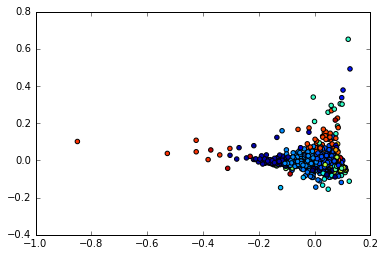

In [11]:
# Import the PCA model.
from sklearn.decomposition import PCA

# Create a PCA model.
pca_2 = PCA(2)
# Fit the PCA model on the numeric columns from earlier.
plot_columns = pca_2.fit_transform(normalized_numeric_df)
# Make a scatter plot of each game, shaded according to cluster assignment.
plt.scatter(x=plot_columns[:,0], y=plot_columns[:,1], c=labels)
# Show the plot.
plt.show()

In [12]:
cluster_occs = {}
occ_cluster = {}
for i in range(len(labels)):
    cluster = labels[i]
    occ = normalized_numeric_df.index[i]

    if cluster not in cluster_occs:
        cluster_occs[cluster] = []
    cluster_occs[cluster].append(occ)
    
    if occ not in occ_cluster:
        occ_cluster[occ] = []
    occ_cluster[occ].append(cluster)


# Store occ_cluster and clusters_occs

In [10]:
normalized_numeric_transponse_df = normalized_numeric_df.transpose()

normalized_numeric_transponse_df[:10]

Detailed SOC Occupation,Accountants and Auditors,Actors,Actuaries,"Administrative Law Judges, Adjudicators, and Hearing Officers",Administrative Services Managers,"Adult Literacy, Remedial Education, and GED Teachers and Instructors",Advertising Sales Agents,Advertising and Promotions Managers,Aerospace Engineering and Operations Technicians,Aerospace Engineers,...,"Weighers, Measurers, Checkers, and Samplers, Recordkeeping","Welders, Cutters, Solderers, and Brazers","Welding, Soldering, and Brazing Machine Setters, Operators, and Tenders",Wellhead Pumpers,"Wholesale and Retail Buyers, Except Farm Products","Woodworkers, All Other","Woodworking Machine Setters, Operators, and Tenders, Except Sawing",Word Processors and Typists,Writers and Authors,Zoologists and Wildlife Biologists
Accounting and Business or Management\CIP CODE 52.0305,0.041923,0.000000,0.000699,0.000000,0.013469,0.000000,0.000661,0.001382,0.0,0.0000,...,0.016310,0.000652,0.000000,0.0,0.003184,0.0,0.0,0.000000,0.000000,0.0
Accounting and Computer Science\CIP CODE 30.1601,0.003940,0.000000,0.000000,0.000000,0.000887,0.000000,0.000220,0.000193,0.0,0.0000,...,0.004077,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0
Accounting and Finance\CIP CODE 52.0304,0.066416,0.000000,0.002795,0.000000,0.012037,0.000000,0.000661,0.000608,0.0,0.0000,...,0.004077,0.000869,0.013423,0.0,0.002506,0.0,0.0,0.003170,0.000557,0.0
"Accounting and Related Services, Other\CIP CODE 52.0399",0.000537,0.000000,0.000000,0.000000,0.000045,0.000000,0.000000,0.000000,0.0,0.0000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0
Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,0.000232,0.000000,0.000000,0.000000,0.000216,0.000000,0.000000,0.000000,0.0,0.0000,...,0.007136,0.000000,0.000000,0.0,0.000123,0.0,0.0,0.000000,0.000000,0.0
Accounting\CIP CODE 52.0301,0.602159,0.013051,0.013450,0.018135,0.086703,0.001982,0.002479,0.004008,0.0,0.0001,...,0.077472,0.002390,0.000000,0.0,0.030282,0.0,0.0,0.026941,0.001114,0.0
Acoustics\CIP CODE 40.0809,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0
Acting\CIP CODE 50.0506,0.000017,0.052202,0.000000,0.000000,0.000045,0.000000,0.000000,0.000221,0.0,0.0000,...,0.000000,0.000000,0.000000,0.0,0.000164,0.0,0.0,0.000000,0.000171,0.0
Actuarial Science\CIP CODE 52.1304,0.000289,0.000000,0.341310,0.000000,0.000125,0.000000,0.000000,0.000083,0.0,0.0000,...,0.000000,0.000000,0.000000,0.0,0.000082,0.0,0.0,0.000000,0.000257,0.0
Acupuncture and Oriental Medicine\CIP CODE 51.3301,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0


In [11]:
# Item-based collaborative filtering

# Create a placeholder dataframe listing item vs. item
data_ibs = pd.DataFrame(index=normalized_numeric_transponse_df.columns,columns=normalized_numeric_transponse_df.columns)
 
# Lets fill in those empty spaces with cosine similarities
# Loop through the columns
for i in range(0,len(data_ibs.columns)) :
    # Loop through the columns for each column
    for j in range(0,len(data_ibs.columns)) :
      # Fill in placeholder with cosine similarities
      data_ibs.ix[i,j] = 1-cosine(normalized_numeric_transponse_df.ix[:,i],normalized_numeric_transponse_df.ix[:,j])
 
# Create a placeholder items for closes neighbours to an item
data_neighbours = pd.DataFrame(index=data_ibs.columns,columns=[range(1,11)])
 
# Loop through our similarity dataframe and fill in neighbouring item names
for i in range(0,len(data_ibs.columns)):
    data_neighbours.ix[i,:10] = data_ibs.ix[0:,i].sort_values(ascending=False)[:10].index

In [22]:
#data_neighbours.head(6).ix[:6, 2:]
similar_jobs_df = data_neighbours.copy()
# similar_jobs.drop('0', axis=1)
similar_jobs_df.drop(similar_jobs_df.columns[[0]], axis=1, inplace=True)
similar_jobs_df

,2,3,4,5,6,7,8,9,10
Detailed SOC Occupation,,,,,,,,,
Accountants and Auditors,Tax Preparers,"Bookkeeping, Accounting, and Auditing Clerks","Tax Examiners, Collectors, and Revenue Agents",Financial Managers,Payroll and Timekeeping Clerks,Budget Analysts,Chief Executives,Bill and Account Collectors,First-Line Supervisors/Managers of Office and ...
Actors,Radio and Television Announcers,Broadcast Technicians,Producers and Directors,Broadcast News Analysts,Radio Operators,Public Relations Managers,Public Relations Specialists,Set and Exhibit Designers,"Communications Teachers, Postsecondary"
Actuaries,Mathematicians,"Ambulance Drivers and Attendants, Except Emerg...","Mathematical Science Teachers, Postsecondary",Statistical Assistants,"Mathematical Science Occupations, All Other","Grinding, Lapping, Polishing, and Buffing Mach...",Structural Iron and Steel Workers,Statisticians,"Computer Software Engineers, Systems Software"
"Administrative Law Judges, Adjudicators, and Hearing Officers",Lawyers,"Law Teachers, Postsecondary",Law Clerks,"Judges, Magistrate Judges, and Magistrates",Legislators,"Legal Support Workers, All Other","Arbitrators, Mediators, and Conciliators","Criminal Justice and Law Enforcement Teachers,...",Sociologists
Administrative Services Managers,First-Line Supervisors/Managers of Office and ...,Bill and Account Collectors,Loan Counselors,Tellers,"Title Examiners, Abstractors, and Searchers",Stock Clerks and Order Fillers,"Office Clerks, General",General and Operations Managers,"Secretaries, Except Legal, Medical, and Executive"
"Adult Literacy, Remedial Education, and GED Teachers and Instructors","Middle School Teachers, Except Special and Voc...","Teachers and Instructors, All Other","Secondary School Teachers, Except Special and ...",Instructional Coordinators,"English Language and Literature Teachers, Post...","Postsecondary Teachers, All Other",Technical Writers,"Library Assistants, Clerical","Elementary School Teachers, Except Special Edu..."
Advertising Sales Agents,Advertising and Promotions Managers,"Media and Communication Workers, All Other",Marketing Managers,"Sales and Related Workers, All Other",Market Research Analysts,"Sales Representatives, Wholesale and Manufactu...",Public Relations Specialists,Meeting and Convention Planners,"Sales Representatives, Wholesale and Manufactu..."
Advertising and Promotions Managers,Advertising Sales Agents,"Media and Communication Workers, All Other",Marketing Managers,"Sales and Related Workers, All Other",Public Relations Specialists,Market Research Analysts,"Sales Representatives, Wholesale and Manufactu...",Meeting and Convention Planners,"Sales Representatives, Wholesale and Manufactu..."
Aerospace Engineering and Operations Technicians,Aerospace Engineers,Electrical and Electronic Engineering Technicians,Electrical and Electronics Installers and Repa...,Conveyor Operators and Tenders,Electro-Mechanical Technicians,Slot Key Persons,Radar and Sonar Technicians,"Electrical and Electronics Repairers, Powerhou...","Electrical and Electronics Repairers, Commerci..."


In [26]:
similar_jobs = {}
for index, row in similar_jobs_df.iterrows():    
    similar_jobs[index] = row.tolist()

similar_jobs

{'Accountants and Auditors': ['Tax Preparers',
  'Bookkeeping, Accounting, and Auditing Clerks',
  'Tax Examiners, Collectors, and Revenue Agents',
  'Financial Managers',
  'Payroll and Timekeeping Clerks',
  'Budget Analysts',
  'Chief Executives',
  'Bill and Account Collectors',
  'First-Line Supervisors/Managers of Office and Administrative Support Workers'],
 'Actors': ['Radio and Television Announcers',
  'Broadcast Technicians',
  'Producers and Directors',
  'Broadcast News Analysts',
  'Radio Operators',
  'Public Relations Managers',
  'Public Relations Specialists',
  'Set and Exhibit Designers',
  'Communications Teachers, Postsecondary'],
 'Actuaries': ['Mathematicians',
  'Ambulance Drivers and Attendants, Except Emergency Medical Technicians',
  'Mathematical Science Teachers, Postsecondary',
  'Statistical Assistants',
  'Mathematical Science Occupations, All Other',
  'Grinding, Lapping, Polishing, and Buffing Machine Tool Setters, Operators, and Tenders, Metal and Pl

In [27]:
import json
with open('similar_jobs.json', 'w') as fp:
    json.dump(similar_jobs, fp)

In [17]:
df_data[:8]

,SOC Code,Detailed SOC Occupation,Sample Name,Accounting and Business or Management\CIP CODE 52.0305,Accounting and Computer Science\CIP CODE 30.1601,Accounting and Finance\CIP CODE 52.0304,"Accounting and Related Services, Other\CIP CODE 52.0399",Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,Accounting\CIP CODE 52.0301,Acoustics\CIP CODE 40.0809,...,Word Processing\CIP CODE 11.0602,Work and Family Studies\CIP CODE 19.0000,Workforce Development and Training\CIP CODE 32.0111,"Writing, General\CIP CODE 23.1301",Yoga Teacher Training or Yoga Therapy\CIP CODE 51.3602,Youth Ministry\CIP CODE 39.0702,Youth Services or Administration\CIP CODE 44.0702,Zoological Medicine Residency Program\CIP CODE 60.0317,"Zoology or Animal Biology, Other\CIP CODE 26.0799",Zoology or Animal Biology\CIP CODE 26.0701
0,11-1011.00,Chief Executives,All,747,41,1550,5,4,6741,0,...,1,5,8,14,0,10,0,0,0,42
1,11-1011.00,Chief Executives,Males,411,23,1063,4,0,4119,0,...,1,2,4,1,0,8,0,0,0,21
2,11-1011.00,Chief Executives,Females,274,16,343,1,4,2034,0,...,0,3,4,13,0,0,0,0,0,19
3,11-1011.00,Chief Executives,Highest Degree Associates,22,4,19,0,1,177,0,...,0,0,0,0,0,0,0,0,0,0
4,11-1011.00,Chief Executives,Highest Degree Bachelors,486,24,807,3,3,4777,0,...,0,4,2,7,0,7,0,0,0,21
5,11-1011.00,Chief Executives,Highest Degree non-MBA Masters,50,3,94,1,0,513,0,...,0,0,5,7,0,1,0,0,0,4
6,11-1011.00,Chief Executives,Highest Degree MBA,123,5,503,0,0,603,0,...,0,0,0,0,0,0,0,0,0,2
7,11-1011.00,Chief Executives,Gen Y (1982-2000),16,0,34,0,0,178,0,...,0,0,0,2,0,1,0,0,0,0


In [2]:
df_data_floats = pd.read_csv('data.csv')
df_data_floats.head()

,SOC Code,Detailed SOC Occupation,Sample Name,Accounting and Business or Management\CIP CODE 52.0305,Accounting and Computer Science\CIP CODE 30.1601,Accounting and Finance\CIP CODE 52.0304,"Accounting and Related Services, Other\CIP CODE 52.0399",Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,Accounting\CIP CODE 52.0301,Acoustics\CIP CODE 40.0809,...,Word Processing\CIP CODE 11.0602,Work and Family Studies\CIP CODE 19.0000,Workforce Development and Training\CIP CODE 32.0111,"Writing, General\CIP CODE 23.1301",Yoga Teacher Training or Yoga Therapy\CIP CODE 51.3602,Youth Ministry\CIP CODE 39.0702,Youth Services or Administration\CIP CODE 44.0702,Zoological Medicine Residency Program\CIP CODE 60.0317,"Zoology or Animal Biology, Other\CIP CODE 26.0799",Zoology or Animal Biology\CIP CODE 26.0701
0,11-1011.00,Chief Executives,All,747.0,41.0,1550.0,5.0,4.0,6741.0,NaN,...,1.0,5.0,8.0,14.0,NaN,10.0,NaN,NaN,NaN,42.0
1,11-1011.00,Chief Executives,Males,411.0,23.0,1063.0,4.0,NaN,4119.0,NaN,...,1.0,2.0,4.0,1.0,NaN,8.0,NaN,NaN,NaN,21.0
2,11-1011.00,Chief Executives,Females,274.0,16.0,343.0,1.0,4.0,2034.0,NaN,...,NaN,3.0,4.0,13.0,NaN,NaN,NaN,NaN,NaN,19.0
3,11-1011.00,Chief Executives,Highest Degree Associates,22.0,4.0,19.0,NaN,1.0,177.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,11-1011.00,Chief Executives,Highest Degree Bachelors,486.0,24.0,807.0,3.0,3.0,4777.0,NaN,...,NaN,4.0,2.0,7.0,NaN,7.0,NaN,NaN,NaN,21.0


In [3]:
df_data_transpose = df_data_floats.transpose()

df_data_transpose.head()

,0,1,2,3,4,5,6,7,8,9,...,8200,8201,8202,8203,8204,8205,8206,8207,8208,8209
SOC Code,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,...,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00
Detailed SOC Occupation,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...
Sample Name,All,Males,Females,Highest Degree Associates,Highest Degree Bachelors,Highest Degree non-MBA Masters,Highest Degree MBA,Gen Y (1982-2000),Gen X (1965-1981),Baby Boomer (1946-1964),...,All,Males,Females,Highest Degree Associates,Highest Degree Bachelors,Highest Degree non-MBA Masters,Highest Degree MBA,Gen Y (1982-2000),Gen X (1965-1981),Baby Boomer (1946-1964)
Accounting and Business or Management\CIP CODE 52.0305,747,411,274,22,486,50,123,16,204,409,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Accounting and Computer Science\CIP CODE 30.1601,41,23,16,4,24,3,5,NaN,18,20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
feature_norm_transpose = df_data_transpose
for column in df_data_transpose:
    idx = int(column)
    if df_data_transpose[column]['Sample Name'] == 'Males':
        sum_df = df_data_transpose[idx+1] + df_data_transpose[idx]
        feature_norm_transpose[idx][3:] = df_data_transpose[idx][3:].divide(sum_df[3:])
        feature_norm_transpose[idx+1][3:] = df_data_transpose[idx+1][3:].divide(sum_df[3:])
    
    if df_data_transpose[column]['Sample Name'] == 'Highest Degree Associates':
        sum_df = df_data_transpose[idx] + df_data_transpose[idx+1] + df_data_transpose[idx+2] + df_data_transpose[idx+3]
        feature_norm_transpose[idx][3:] = df_data_transpose[idx][3:].divide(sum_df[3:])
        feature_norm_transpose[idx+1][3:] = df_data_transpose[idx+1][3:].divide(sum_df[3:])
        feature_norm_transpose[idx+2][3:] = df_data_transpose[idx+2][3:].divide(sum_df[3:])
        feature_norm_transpose[idx+3][3:] = df_data_transpose[idx+3][3:].divide(sum_df[3:])
    
    if df_data_transpose[column]['Sample Name'] == 'Gen Y (1982-2000)':
        sum_df = df_data_transpose[idx] + df_data_transpose[idx+1] + df_data_transpose[idx+2]
        feature_norm_transpose[idx][3:] = df_data_transpose[idx][3:].divide(sum_df[3:])
        feature_norm_transpose[idx+1][3:] = df_data_transpose[idx+1][3:].divide(sum_df[3:])
        feature_norm_transpose[idx+2][3:] = df_data_transpose[idx+2][3:].divide(sum_df[3:])
   

In [7]:
feature_norm = feature_norm_transpose.transpose()
feature_norm = feature_norm.fillna(0.000001)
feature_norm

,SOC Code,Detailed SOC Occupation,Sample Name,Accounting and Business or Management\CIP CODE 52.0305,Accounting and Computer Science\CIP CODE 30.1601,Accounting and Finance\CIP CODE 52.0304,"Accounting and Related Services, Other\CIP CODE 52.0399",Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,Accounting\CIP CODE 52.0301,Acoustics\CIP CODE 40.0809,...,Word Processing\CIP CODE 11.0602,Work and Family Studies\CIP CODE 19.0000,Workforce Development and Training\CIP CODE 32.0111,"Writing, General\CIP CODE 23.1301",Yoga Teacher Training or Yoga Therapy\CIP CODE 51.3602,Youth Ministry\CIP CODE 39.0702,Youth Services or Administration\CIP CODE 44.0702,Zoological Medicine Residency Program\CIP CODE 60.0317,"Zoology or Animal Biology, Other\CIP CODE 26.0799",Zoology or Animal Biology\CIP CODE 26.0701
0,11-1011.00,Chief Executives,All,747.000000,41.000000,1550.000000,5.000000,4.000000,6741.000000,0.000001,...,1.000000,5.000000,8.000000,14.000000,0.000001,10.000000,0.000001,0.000001,0.000001,42.000000
1,11-1011.00,Chief Executives,Males,0.600000,0.589744,0.756046,0.800000,0.000001,0.669430,0.000001,...,0.000001,0.400000,0.500000,0.071429,0.000001,0.000001,0.000001,0.000001,0.000001,0.525000
2,11-1011.00,Chief Executives,Females,0.400000,0.410256,0.243954,0.200000,0.000001,0.330570,0.000001,...,0.000001,0.600000,0.500000,0.928571,0.000001,0.000001,0.000001,0.000001,0.000001,0.475000
3,11-1011.00,Chief Executives,Highest Degree Associates,0.032305,0.111111,0.013352,0.000001,0.000001,0.029160,0.000001,...,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001
4,11-1011.00,Chief Executives,Highest Degree Bachelors,0.713656,0.666667,0.567112,0.000001,0.000001,0.786985,0.000001,...,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001
5,11-1011.00,Chief Executives,Highest Degree non-MBA Masters,0.073421,0.083333,0.066058,0.000001,0.000001,0.084514,0.000001,...,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001
6,11-1011.00,Chief Executives,Highest Degree MBA,0.180617,0.138889,0.353479,0.000001,0.000001,0.099341,0.000001,...,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001
7,11-1011.00,Chief Executives,Gen Y (1982-2000),0.000041,0.000001,0.000021,0.000001,0.000001,0.000006,0.000001,...,0.000001,0.000001,0.000001,0.019802,0.000001,0.017544,0.000001,0.000001,0.000001,0.000001
8,11-1011.00,Chief Executives,Gen X (1965-1981),0.332776,0.000001,0.433351,0.000001,0.000001,0.432019,0.000001,...,0.000001,0.000001,0.000001,0.653465,0.000001,0.561404,0.000001,0.000001,0.000001,0.000001
9,11-1011.00,Chief Executives,Baby Boomer (1946-1964),0.667183,0.000001,0.566628,0.000001,0.000001,0.567975,0.000001,...,0.000001,0.000001,0.000001,0.326733,0.000001,0.421053,0.000001,0.000001,0.000001,0.000001


In [6]:
computed_df = feature_norm.copy()


In [8]:
feature_norm_transpose

,0,1,2,3,4,5,6,7,8,9,...,8200,8201,8202,8203,8204,8205,8206,8207,8208,8209
SOC Code,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,11-1011.00,...,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00,55-3019.00
Detailed SOC Occupation,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,Chief Executives,...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...,Military Enlisted Tactical Operations and Air/...
Sample Name,All,Males,Females,Highest Degree Associates,Highest Degree Bachelors,Highest Degree non-MBA Masters,Highest Degree MBA,Gen Y (1982-2000),Gen X (1965-1981),Baby Boomer (1946-1964),...,All,Males,Females,Highest Degree Associates,Highest Degree Bachelors,Highest Degree non-MBA Masters,Highest Degree MBA,Gen Y (1982-2000),Gen X (1965-1981),Baby Boomer (1946-1964)
Accounting and Business or Management\CIP CODE 52.0305,747,0.6,0.4,0.0323054,0.713656,0.0734214,0.180617,4.14945e-05,0.332776,0.667183,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Accounting and Computer Science\CIP CODE 30.1601,41,0.589744,0.410256,0.111111,0.666667,0.0833333,0.138889,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Accounting and Finance\CIP CODE 52.0304,1550,0.756046,0.243954,0.0133521,0.567112,0.0660576,0.353479,2.10834e-05,0.433351,0.566628,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Accounting and Related Services, Other\CIP CODE 52.0399",5,0.8,0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Accounting\CIP CODE 52.0301,6741,0.66943,0.33057,0.0291598,0.786985,0.084514,0.099341,5.52053e-06,0.432019,0.567975,...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Acoustics\CIP CODE 40.0809,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
computed_df = pd.DataFrame()
for column in feature_norm_transpose:
    idx = int(column)
    occ_name = feature_norm_transpose[column]['Detailed SOC Occupation']
    if feature_norm_transpose[column]['Sample Name'] == 'Males':
        gender_name = feature_norm_transpose[column]['Sample Name']
        gender_probs = feature_norm_transpose[column][3:]
        
        age_idx = idx + 6
        age_name = feature_norm_transpose[age_idx]['Sample Name']
        age_probs = feature_norm_transpose[age_idx][3:]
        for i in range(4):
            degree_idx = idx + 2 + i
            degree_name = feature_norm_transpose[degree_idx]['Sample Name']
            degree_probs = feature_norm_transpose[degree_idx][3:]

            name = "{}+{}+{}+{}".format(gender_name, degree_name, age_name, occ_name)

            bucket_probs = gender_probs * degree_probs * age_probs
            bucket_df = pd.DataFrame({name: bucket_probs})
            if idx == 1:
                computed_df = bucket_df
            else:
                computed_df[name] = bucket_probs
    
    if feature_norm_transpose[column]['Sample Name'] == 'Females':
        gender_name = feature_norm_transpose[column]['Sample Name']
        gender_probs = feature_norm_transpose[column][3:]
        
        age_idx = idx + 5
        age_name = feature_norm_transpose[age_idx]['Sample Name']
        age_probs = feature_norm_transpose[age_idx][3:]
        for i in range(4):
            degree_idx = idx + 1 + i
            degree_name = feature_norm_transpose[degree_idx]['Sample Name']
            degree_probs = feature_norm_transpose[degree_idx][3:]

            name = "{}+{}+{}+{}".format(gender_name, degree_name, age_name, occ_name)

            bucket_probs = gender_probs * degree_probs * age_probs
            bucket_df = pd.DataFrame({name: bucket_probs})
            if idx == 1:
                computed_df = bucket_df
            else:
                computed_df[name] = bucket_probs

computed_df

,Males+Highest Degree MBA+Gen Y (1982-2000)+Chief Executives,Females+Highest Degree Associates+Gen Y (1982-2000)+Chief Executives,Females+Highest Degree Bachelors+Gen Y (1982-2000)+Chief Executives,Females+Highest Degree non-MBA Masters+Gen Y (1982-2000)+Chief Executives,Females+Highest Degree MBA+Gen Y (1982-2000)+Chief Executives,Males+Highest Degree Associates+Gen Y (1982-2000)+General and Operations Managers,Males+Highest Degree Bachelors+Gen Y (1982-2000)+General and Operations Managers,Males+Highest Degree non-MBA Masters+Gen Y (1982-2000)+General and Operations Managers,Males+Highest Degree MBA+Gen Y (1982-2000)+General and Operations Managers,Females+Highest Degree Associates+Gen Y (1982-2000)+General and Operations Managers,...,Females+Highest Degree non-MBA Masters+Gen Y (1982-2000)+Special Forces,Females+Highest Degree MBA+Gen Y (1982-2000)+Special Forces,"Males+Highest Degree Associates+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Males+Highest Degree Bachelors+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Males+Highest Degree non-MBA Masters+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Males+Highest Degree MBA+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Females+Highest Degree Associates+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Females+Highest Degree Bachelors+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Females+Highest Degree non-MBA Masters+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Females+Highest Degree MBA+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other"
Accounting and Business or Management\CIP CODE 52.0305,4.49676e-06,5.36199e-07,1.18451e-05,1.21864e-06,2.99784e-06,3.67155e-05,9.26425e-05,5.55001e-06,1.96385e-05,4.09445e-05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Accounting and Computer Science\CIP CODE 30.1601,NaN,NaN,NaN,NaN,NaN,0.000384818,0.00153927,0.000256545,0.000128273,0.000405071,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Accounting and Finance\CIP CODE 52.0304,5.63445e-06,6.86748e-08,2.91687e-06,3.3976e-07,1.81808e-06,3.60914e-06,8.40717e-05,7.85518e-06,5.73216e-05,1.73694e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Accounting and Related Services, Other\CIP CODE 52.0399",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Accounting\CIP CODE 52.0301,3.67125e-07,5.32144e-08,1.43619e-06,1.54232e-07,1.8129e-07,2.05435e-06,1.37425e-05,1.3411e-06,1.76805e-06,1.4862e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Acoustics\CIP CODE 40.0809,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Acting\CIP CODE 50.0506,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Actuarial Science\CIP CODE 52.1304,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Acupuncture and Oriental Medicine\CIP CODE 51.3301,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
computed_df = computed_df.fillna(0)
computed_df

,Males+Highest Degree MBA+Gen Y (1982-2000)+Chief Executives,Females+Highest Degree Associates+Gen Y (1982-2000)+Chief Executives,Females+Highest Degree Bachelors+Gen Y (1982-2000)+Chief Executives,Females+Highest Degree non-MBA Masters+Gen Y (1982-2000)+Chief Executives,Females+Highest Degree MBA+Gen Y (1982-2000)+Chief Executives,Males+Highest Degree Associates+Gen Y (1982-2000)+General and Operations Managers,Males+Highest Degree Bachelors+Gen Y (1982-2000)+General and Operations Managers,Males+Highest Degree non-MBA Masters+Gen Y (1982-2000)+General and Operations Managers,Males+Highest Degree MBA+Gen Y (1982-2000)+General and Operations Managers,Females+Highest Degree Associates+Gen Y (1982-2000)+General and Operations Managers,...,Females+Highest Degree non-MBA Masters+Gen Y (1982-2000)+Special Forces,Females+Highest Degree MBA+Gen Y (1982-2000)+Special Forces,"Males+Highest Degree Associates+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Males+Highest Degree Bachelors+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Males+Highest Degree non-MBA Masters+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Males+Highest Degree MBA+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Females+Highest Degree Associates+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Females+Highest Degree Bachelors+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Females+Highest Degree non-MBA Masters+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other","Females+Highest Degree MBA+Gen Y (1982-2000)+Military Enlisted Tactical Operations and Air/Weapons Specialists and Crew Members, All Other"
Accounting and Business or Management\CIP CODE 52.0305,4.496764e-06,5.361995e-07,0.000012,1.218635e-06,2.997843e-06,0.000037,0.000093,5.550010e-06,1.963850e-05,0.000041,...,0,0,0,0,0,0,0,0,0,0
Accounting and Computer Science\CIP CODE 30.1601,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000385,0.001539,2.565453e-04,1.282726e-04,0.000405,...,0,0,0,0,0,0,0,0,0,0
Accounting and Finance\CIP CODE 52.0304,5.634445e-06,6.867484e-08,0.000003,3.397597e-07,1.818076e-06,0.000004,0.000084,7.855184e-06,5.732161e-05,0.000002,...,0,0,0,0,0,0,0,0,0,0
"Accounting and Related Services, Other\CIP CODE 52.0399",0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,...,0,0,0,0,0,0,0,0,0,0
Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,...,0,0,0,0,0,0,0,0,0,0
Accounting\CIP CODE 52.0301,3.671251e-07,5.321440e-08,0.000001,1.542316e-07,1.812897e-07,0.000002,0.000014,1.341103e-06,1.768045e-06,0.000001,...,0,0,0,0,0,0,0,0,0,0
Acoustics\CIP CODE 40.0809,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,...,0,0,0,0,0,0,0,0,0,0
Acting\CIP CODE 50.0506,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,...,0,0,0,0,0,0,0,0,0,0
Actuarial Science\CIP CODE 52.1304,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,...,0,0,0,0,0,0,0,0,0,0
Acupuncture and Oriental Medicine\CIP CODE 51.3301,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,...,0,0,0,0,0,0,0,0,0,0


In [14]:
computed_df_transpose = computed_df.transpose()
computed_df_transpose

,Accounting and Business or Management\CIP CODE 52.0305,Accounting and Computer Science\CIP CODE 30.1601,Accounting and Finance\CIP CODE 52.0304,"Accounting and Related Services, Other\CIP CODE 52.0399",Accounting Technology or Technician and Bookkeeping\CIP CODE 52.0302,Accounting\CIP CODE 52.0301,Acoustics\CIP CODE 40.0809,Acting\CIP CODE 50.0506,Actuarial Science\CIP CODE 52.1304,Acupuncture and Oriental Medicine\CIP CODE 51.3301,...,Word Processing\CIP CODE 11.0602,Work and Family Studies\CIP CODE 19.0000,Workforce Development and Training\CIP CODE 32.0111,"Writing, General\CIP CODE 23.1301",Yoga Teacher Training or Yoga Therapy\CIP CODE 51.3602,Youth Ministry\CIP CODE 39.0702,Youth Services or Administration\CIP CODE 44.0702,Zoological Medicine Residency Program\CIP CODE 60.0317,"Zoology or Animal Biology, Other\CIP CODE 26.0799",Zoology or Animal Biology\CIP CODE 26.0701
Males+Highest Degree MBA+Baby Boomer (1946-1964)+Chief Executives,0.070466,0.000000,0.147432,0.0,0.0,0.036606,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Females+Highest Degree Associates+Gen Y (1982-2000)+Chief Executives,0.000329,0.000000,0.000086,0.0,0.0,0.000297,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Females+Highest Degree Associates+Gen X (1965-1981)+Chief Executives,0.004191,0.000000,0.001374,0.0,0.0,0.004036,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Females+Highest Degree Associates+Baby Boomer (1946-1964)+Chief Executives,0.008402,0.000000,0.001797,0.0,0.0,0.005306,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Females+Highest Degree Bachelors+Gen Y (1982-2000)+Chief Executives,0.007261,0.000000,0.003655,0.0,0.0,0.008028,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Females+Highest Degree Bachelors+Gen X (1965-1981)+Chief Executives,0.092582,0.000000,0.058371,0.0,0.0,0.108924,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Females+Highest Degree Bachelors+Baby Boomer (1946-1964)+Chief Executives,0.185619,0.000000,0.076323,0.0,0.0,0.143202,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Females+Highest Degree non-MBA Masters+Gen Y (1982-2000)+Chief Executives,0.000747,0.000000,0.000426,0.0,0.0,0.000862,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Females+Highest Degree non-MBA Masters+Gen X (1965-1981)+Chief Executives,0.009525,0.000000,0.006799,0.0,0.0,0.011697,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Females+Highest Degree non-MBA Masters+Baby Boomer (1946-1964)+Chief Executives,0.019097,0.000000,0.008890,0.0,0.0,0.015378,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


In [16]:
# Remove non-degree samples
def males_mbs_baby_boomer_mask(x):
    print x
    return x

computed_df_transpose[computed_df_transpose.apply(males_mbs_baby_boomer_mask)]

Males+Highest Degree MBA+Baby Boomer (1946-1964)+Chief Executives                                                                                               0.070466
Females+Highest Degree Associates+Gen Y (1982-2000)+Chief Executives                                                                                            0.000329
Females+Highest Degree Associates+Gen X (1965-1981)+Chief Executives                                                                                            0.004191
Females+Highest Degree Associates+Baby Boomer (1946-1964)+Chief Executives                                                                                      0.008402
Females+Highest Degree Bachelors+Gen Y (1982-2000)+Chief Executives                                                                                             0.007261
Females+Highest Degree Bachelors+Gen X (1965-1981)+Chief Executives                                                                                        

ValueError: Must pass DataFrame with boolean values only

In [12]:
len(computed_df)

1534

In [ ]:
best_job = {}
for i in range(len(computed_df)):
    if i % 100 == 0:
        print 'At row {}...'.format(i)
    major = computed_df.index[i]
    for j in range(len(computed_df.columns)):
        if j % 1000 == 0:
            print 'At row {} column {}...'.format(i, j)
        
        if computed_df.iloc[i,j] == 0:
            continue
        
        tokens = computed_df.columns[j].split("+")
        occ = tokens[-1]
        feature_name = "+".join(tokens[:-1])
        feature_name += "+" + major
        if feature_name not in best_job:
            best_job[feature_name] = [occ, computed_df.iloc[i,j]]
        elif best_job[feature_name][1] < computed_df.iloc[i,j]:
            best_job[feature_name] = [occ, computed_df.iloc[i,j]]
    
best_job

At row 0...
At row 0 column 0...
At row 0 column 1000...
At row 0 column 2000...
At row 0 column 3000...
At row 0 column 4000...
At row 0 column 5000...
At row 0 column 6000...
At row 1 column 0...
At row 1 column 1000...
At row 1 column 2000...
At row 1 column 3000...
At row 1 column 4000...
At row 1 column 5000...
At row 1 column 6000...
At row 2 column 0...
At row 2 column 1000...
At row 2 column 2000...


In [ ]:
# Remove non-degree samples
def degree_mask(x):
    sample = x
    return sample != 0 and sample != 9 and sample != 2 and sample != 3 and sample != 1

degree_encoded_df = encoded_df[encoded_df['Sample Name'].apply(degree_mask)]

In [ ]:
degree_encoded_df
degree_encoded_df = degree_encoded_df.groupby(degree_encoded_df['Sample Name']).apply(np.sum)
degree_encoded_df.drop(['Sample Name', 'SOC Code'], axis=1)

In [27]:
for i in range(4):
    print i

0
1
2
3
